# 3D Image Segmentation of BraTS-2018

BraTS-2018 utilizes multi-institutional pre-operative MRI scans and focuses on the segmentation of intrinsically heterogeneous (in appearance, shape, and histology) brain tumors, namely gliomas. Furthemore, to pinpoint the clinical relevance of this segmentation task

The sub-regions considered for evaluation are: 
1) the "enhancing tumor" (ET),

2) the "tumor core" (TC), and 

3) the "whole tumor" (WT) 

The labels in the provided data are: 

- 1: for NCR & NET

- 2: for ED

- 4: for ET, and

- 0: for everything else

### Importing Libraries

In [1]:
import os, glob
import cv2
import h5py
import imageio
import numpy as np
import matplotlib.pyplot as plt
import nibabel as nib
import tensorflow as tf
import pandas as pd

from tensorflow import keras
from tensorflow.keras import backend as K 
from IPython.display import Image, display
from tensorflow.keras import Input, Model
from tensorflow.keras.layers import (
    Activation,
    Conv3D,
    Conv3DTranspose,
    MaxPooling3D,
    UpSampling3D,
)
from tensorflow.keras.layers import concatenate
from tensorflow.keras.optimizers import Adam

## Loading Data

Define static constants for loading and preprocessing the data

In [2]:
FILE_NAME = 'MICCAI_BraTS_2018_Data_Training.zip'
ZIP = False

In [3]:
# Root (working) directory
root = os.getcwd()
print(root)

C:\Users\10699\Documents\Jupyter\3D_img_seg


Unzip the dataset if it is zippped

In [ ]:
if ZIP:
    with zipfile.ZipFile(FILE_NAME, 'r') as zip_ref:
        zip_ref.extractall(root)
os.listdir()

In [4]:
HGG_PATH = os.path.join(root, 'HGG')
LGG_PATH = os.path.join(root, 'LGG')

In [5]:
def load_files(directory, fname):
    g_file = nib.load(os.path.join(directory, fname)).get_fdata()
    return np.array(g_file)

In [6]:
def concat(imgs):
    img_4d = imgs[0][..., np.newaxis]
    for s in imgs[1:]:
        img_4d = np.concatenate([img_4d, s[...,np.newaxis]], axis = -1)
    return np.array(img_4d)

In [7]:
def convert_mask_label(img):
    return np.where(img == 4, 3, img).astype('uint8')

In [8]:
def create_data_pair(root, start=0, end=10):
    imgs, msks = [], []
    for dir_lv1 in os.listdir(root)[start:end]:   
        img = []
        dir_lv2 = os.path.join(root, dir_lv1)
        for fname in os.listdir(dir_lv2):
            if fname.endswith('_seg.nii.gz'):
                msks.append(convert_mask_label(load_files(dir_lv2, fname)))
            else:
                img.append(load_files(dir_lv2, fname))
        imgs.append(concat(img))
        
    return np.array(imgs), np.array(msks)

In [160]:
imgs, msks = create_data_pair(HGG_PATH)
imgs.shape, msks.shape

((10, 240, 240, 155, 4), (10, 240, 240, 155))

## Data Preprocessing

In [9]:
IMG_HEIGHT = 80
IMG_WIDTH = IMG_HEIGHT
IMG_DEPTH = 16
IMG_SIZE = (IMG_HEIGHT, IMG_WIDTH, IMG_DEPTH)

BATCH_SIZE = 32
VALID_SPLIT = 0.1
TEST_SPLIT = 0.1

### Sub-Volume Sampling

In [10]:
def resize(img, w=IMG_WIDTH, h=IMG_HEIGHT, d=IMG_DEPTH, interp=cv2.INTER_CUBIC):
    channels = img.shape[-1]
    
    img_stack_sm = np.zeros((w, h, d, channels))

    for i in range(channels):
        for j in range(d):
            img1 = img[:, :, j, i]
            img_sm = cv2.resize(img1, (h, w), interpolation=interp)
            img_stack_sm[:, :, j, i] = img_sm

    return img_stack_sm

In [11]:
def get_sub_volume(image, label, 
                   orig_x = 240, orig_y = 240, orig_z = 155, 
                   output_x = 160, output_y = 160, output_z = 16,
                   num_classes = 4, max_tries = 500, background_threshold = 0.95,
                   err_print = False):
    X = None
    y = None

    tries = 0    
    while tries < max_tries:
        start_x = np.random.randint(0, orig_x - output_x+1)
        start_y = np.random.randint(0, orig_y - output_y+1)
        start_z = np.random.randint(0, orig_z - output_z+1)

        y = label[start_x: start_x + output_x,
                  start_y: start_y + output_y,
                  start_z: start_z + output_z]
        y = keras.utils.to_categorical(y, num_classes=num_classes)
        bgrd_ratio = np.sum(y[:, :, :, 0])/(output_x * output_y * output_z)
        tries += 1

        if bgrd_ratio < background_threshold:
            X = np.copy(image[start_x: start_x + output_x,
                              start_y: start_y + output_y,
                              start_z: start_z + output_z, :])
            y = y[:, :, :, 1:]
    
            X = resize(X)
            y = resize(y)
            
            return X, y

    if err_print:
        print(f"Tried {tries} times to find a sub-volume. Giving up...")
    return False, False

In [162]:
X,y = get_sub_volume(imgs[0], msks[0])
X.shape, y.shape

((80, 80, 16, 4), (80, 80, 16, 3))

In [12]:
def visualize_patch(X, y):
    fig, ax = plt.subplots(1, 2, figsize=[10, 5], squeeze=False)

    ax[0][0].imshow(X[:, :, 0], cmap='Greys_r')
    ax[0][0].set_yticks([])
    ax[0][0].set_xticks([])
    ax[0][1].imshow(y[:, :, 0], cmap='Greys_r')
    ax[0][1].set_xticks([])
    ax[0][1].set_yticks([])

    fig.subplots_adjust(wspace=0, hspace=0)

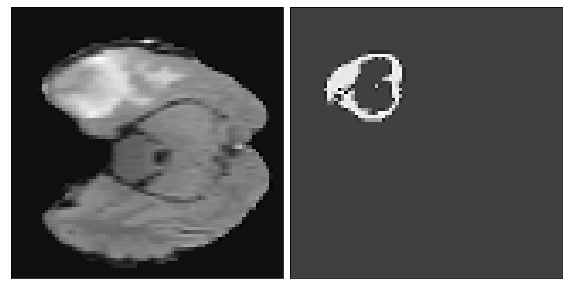

In [164]:
visualize_patch(X[...,0], y[...,2])

### Standardization

In [13]:
def standardize(image):
    standardized_image = np.zeros(image.shape)

    for c in range(image.shape[-1]):
        for z in range(image.shape[2]):
            image_slice = image[:,:,z,c]
            centered = image_slice - np.mean(image_slice)
            
            if np.std(centered) != 0:
                centered_scaled = centered / np.std(centered)
                standardized_image[:, :, z, c] = centered_scaled
            else:
                standardized_image[:, :, z, c] = centered

    return standardized_image

In [166]:
X_norm = standardize(X)
print("standard deviation for a slice should be 1.0")
print(f"stddv for X_norm[0, :, :, 0]: {X_norm[:,:,0, 0].std():.2f}")

standard deviation for a slice should be 1.0
stddv for X_norm[0, :, :, 0]: 1.00


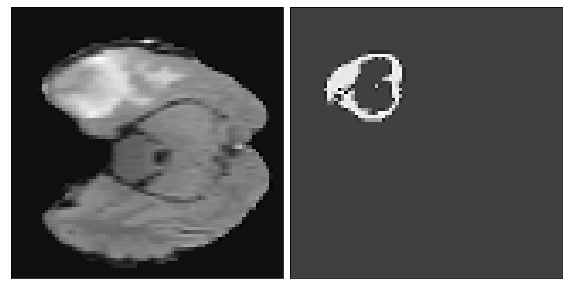

In [167]:
visualize_patch(X_norm[:, :, :, 0], y[...,2])

In [14]:
def preprocess(imgs, labels):
    X, Y = [], []
    for img, label in zip(imgs, labels):
        x, y = get_sub_volume(img, label)
        if x is not False:
            X.append(standardize(x))
            Y.append(y)
    return np.squeeze(np.array(X)), np.squeeze(np.array(Y))

In [91]:
img, label = preprocess(imgs, msks)
x_valid, y_valid = img[0:10], label[0:10]
img, label = img[10:64], label[10:64]

print(img.shape, label.shape)
print(x_valid.shape, y_valid.shape)

Tried 1000 times to find a sub-volume. Giving up...
Tried 1000 times to find a sub-volume. Giving up...
Tried 1000 times to find a sub-volume. Giving up...
Tried 1000 times to find a sub-volume. Giving up...
Tried 1000 times to find a sub-volume. Giving up...
(49, 80, 80, 16, 4) (49, 80, 80, 16, 3)
(10, 80, 80, 16, 4) (10, 80, 80, 16, 3)


### Save Dataset

In [249]:
def save_h5(root, idx, mod):
    img, label = create_data_pair(root, start=idx, end=idx+1)
    img, label = preprocess(img, label)
    
    if img.size != 0:
        if mod == 'valid':
            os.chdir('./validation')
            with h5py.File(list(os.listdir(root))[idx] + '.h5', 'w') as f:
                f.create_dataset("X", img.shape, data = img)
                f.create_dataset("y", label.shape, data = label)
            os.chdir('..')
        elif mod == 'test':
            os.chdir('./test')
            with h5py.File(list(os.listdir(root))[idx] + '.h5', 'w') as f:
                f.create_dataset("X", img.shape, data = img)
                f.create_dataset("y", label.shape, data = label)
            os.chdir('..')
        else:
            os.chdir('./train')
            with h5py.File(list(os.listdir(root))[idx] + '.h5', 'w') as f:
                f.create_dataset("X", img.shape, data = img)
                f.create_dataset("y", label.shape, data = label)
            os.chdir('..')

In [254]:
def save_dataset(root, valid_split=VALID_SPLIT, test_split=TEST_SPLIT, CLEAN = False):
    if CLEAN:
        shutil.rmtree(os.path.join(root,'train'))
        shutil.rmtree(os.path.join(root,'validation'))
        shutil.rmtree(os.path.join(root,'test'))
    
    L = len(os.listdir(root))
    N_valid = int(valid_split*L)
    N_valid_test = int((valid_split+test_split)*L)

    val_test_indices = np.random.choice(range(L), N_valid_test, replace=False)
    train_indices = np.setdiff1d(np.arange(L), val_test_indices)
    
    for idx in val_test_indices[0:N_valid]:
        save_h5(root, idx, 'valid')
    print('[+]Validation dataset saved')
        
    for idx in val_test_indices[N_valid:N_valid_test]:
        save_h5(root, idx, 'test')
    print('[+]Test dataset saved')
        
    for idx in train_indices:
        save_h5(root, idx, 'train')
    print('[+]Train dataset saved')

## Model Building

### Dice Loss and Dice Coefficient

The Dice coefficient is used for evaluating the similarity between two segments. 
It can be calculated by using:

<img src=https://forums.fast.ai/uploads/default/original/2X/1/1cd52c46e9efaed7670655859a6f919e87a5f7a0.png
     style="width:120px;height:60px"/>

In [14]:
def soft_dice_loss(y_true, y_pred, axis=(1, 2, 3), epsilon=1e-5):
    dice_numerator = 2. * K.sum(y_true * y_pred, axis=axis) + epsilon
    dice_denominator = K.sum(y_true**2, axis=axis) + K.sum(y_pred**2, axis=axis) + epsilon
    dice_loss = 1 - K.mean((dice_numerator)/(dice_denominator))

    return dice_loss

In [15]:
def dice_coefficient(y_true, y_pred, axis=(1, 2, 3), epsilon=1e-5):
    dice_numerator = 2. * K.sum(y_true * y_pred, axis=axis) + epsilon
    dice_denominator = K.sum(y_true, axis=axis) + K.sum(y_pred, axis=axis) + epsilon
    dice_coefficient = K.mean((dice_numerator)/(dice_denominator))
 
    return dice_coefficient

### 3D U-Net

The volumetric(3D) U-Net Structure is shown below.

<img src="3D_UNET.jpg" style="width:800px;"/>

The dimensions used for this implementation is similar to the one shown.

In [16]:
def create_convolution_block(input_layer, n_filters, batch_normalization=False,
                             kernel=(3, 3, 3), activation=None,
                             padding='same', strides=(1, 1, 1),
                             instance_normalization=False):

    layer = Conv3D(n_filters, kernel, padding=padding, strides=strides)(
        input_layer)
    if activation is None:
        return Activation('relu')(layer)
    else:
        return activation()(layer)

In [17]:
def get_up_convolution(n_filters, pool_size, kernel_size=(2, 2, 2),
                       strides=(2, 2, 2),
                       deconvolution=False):
    if deconvolution:
        return Conv3DTranspose(filters=n_filters, kernel_size=kernel_size,
                               strides=strides)
    else:
        return UpSampling3D(size=pool_size)

In [18]:
def unet_model_3d(loss_function, input_shape=(IMG_WIDTH, IMG_HEIGHT, IMG_DEPTH, 4),
                  pool_size=(2, 2, 2), n_labels=3,
                  initial_learning_rate=0.0001*0.09,
                  deconvolution=False, depth=4, n_base_filters=32,
                  include_label_wise_dice_coefficients=False, metrics=[],
                  batch_normalization=False, activation_name="sigmoid"):
    
    inputs = Input(input_shape)
    current_layer = inputs
    levels = list()

    # add levels with max pooling
    for layer_depth in range(depth):
        layer1 = create_convolution_block(input_layer=current_layer,
                                          n_filters=n_base_filters * (
                                                  2 ** layer_depth),
                                          batch_normalization=batch_normalization)
        layer2 = create_convolution_block(input_layer=layer1,
                                          n_filters=n_base_filters * (
                                                  2 ** layer_depth) * 2,
                                          batch_normalization=batch_normalization)
        if layer_depth < depth - 1:
            current_layer = MaxPooling3D(pool_size=pool_size)(layer2)
            levels.append([layer1, layer2, current_layer])
        else:
            current_layer = layer2
            levels.append([layer1, layer2])

    # add levels with up-convolution or up-sampling
    for layer_depth in range(depth - 2, -1, -1):
        
        up_convolution = get_up_convolution(pool_size=pool_size,
                                            deconvolution=deconvolution,
                                            n_filters=K.int_shape(current_layer)[1])(current_layer)
        
        concat = concatenate([up_convolution, levels[layer_depth][1]], axis=-1)
        
        current_layer = create_convolution_block(n_filters= K.int_shape(levels[layer_depth][1])[1],
                                                 input_layer=concat, 
                                                 batch_normalization=batch_normalization)
        
        current_layer = create_convolution_block(n_filters= K.int_shape(levels[layer_depth][1])[1],
                                                 input_layer=current_layer,
                                                 batch_normalization=batch_normalization)

    final_convolution = Conv3D(n_labels, (1, 1, 1))(current_layer)
    act = Activation(activation_name)(final_convolution)
    model = Model(inputs=inputs, outputs=act)

    if not isinstance(metrics, list):
        metrics = [metrics]

    model.compile(optimizer=Adam(lr=initial_learning_rate), loss=loss_function, metrics=metrics)
    
    return model

In [19]:
model = unet_model_3d(loss_function=soft_dice_loss, metrics=[dice_coefficient])

## Model Training

### Loading h5py Datasets

In [20]:
class VolumeDataGenerator(keras.utils.Sequence):
    def __init__(self, root, batch_size=BATCH_SIZE, shuffle=True, dim=(IMG_WIDTH, IMG_HEIGHT, IMG_DEPTH),
                 num_channels=4, num_classes=3, verbose=1):
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.root = root
        self.dim = dim
        self.num_channels = num_channels
        self.num_classes = num_classes
        self.verbose = verbose
        self.sample_list = list(os.listdir(root))
        self.on_epoch_end()
        
    def on_epoch_end(self):
        'Updates indices after each epoch'
        self.indices = np.arange(len(self.sample_list))
        if self.shuffle == True:
            np.random.shuffle(self.indices)
            
    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.sample_list) / self.batch_size))
    
    def __data_generation(self, list_IDs_temp):
        'Generates data containing batch_size samples'
        X = np.zeros((self.batch_size, *self.dim, self.num_channels), dtype = np.float64)
        y = np.zeros((self.batch_size, *self.dim, self.num_classes), dtype = np.float64)

        for i, ID in enumerate(list_IDs_temp):
            if self.verbose == 1:
                print("Training on: %s" % '../train/' + ID)
            with h5py.File(self.root + ID, 'r') as f:
                X[i] = np.array(f.get("X"))
                y[i] = np.array(f.get("y"))
        return X, y
    
    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indices of the batch
        indices = self.indices[index * self.batch_size: (index + 1) * self.batch_size]
        # Find list of IDs
        sample_list_temp = [self.sample_list[k] for k in indices]
        # Generate data
        X, y = self.__data_generation(sample_list_temp)
        return X, y

In [21]:
train_generator = VolumeDataGenerator(root + "/train/", batch_size=4, verbose=0)
valid_generator = VolumeDataGenerator(root + "/validation/", batch_size=4, verbose=0)

### Training

In [92]:
# Test case

# model.fit(img, label,
#         epochs = 2,
#         use_multiprocessing=True,
#         validation_data= (x_valid,y_valid),
#         verbose=1)

Epoch 1/2
2/2 [==============================] - 349s 128s/step - loss: 0.9307 - dice_coefficient: 0.0378 - val_loss: 0.9063 - val_dice_coefficient: 0.0500
Epoch 2/2
2/2 [==============================] - 1003s 792s/step - loss: 0.9305 - dice_coefficient: 0.0364 - val_loss: 0.9060 - val_dice_coefficient: 0.0500


In [318]:
#steps_per_epoch = 10
n_epochs=10
#validation_steps = 10

model.fit(train_generator,
        #steps_per_epoch=steps_per_epoch,
        epochs=n_epochs,
        #use_multiprocessing=True,
        validation_data=valid_generator,
        #validation_steps=validation_steps,
         verbose=1)

Epoch 1/10
5/5 [==============================] - 1080s 218s/step - loss: 0.9211 - dice_coefficient: 0.0421 - val_loss: 0.9241 - val_dice_coefficient: 0.0403
Epoch 2/10
5/5 [==============================] - 1114s 225s/step - loss: 0.9205 - dice_coefficient: 0.0423 - val_loss: 0.9231 - val_dice_coefficient: 0.0406
Epoch 3/10
5/5 [==============================] - 1089s 219s/step - loss: 0.9199 - dice_coefficient: 0.0425 - val_loss: 0.9235 - val_dice_coefficient: 0.0404
Epoch 4/10
5/5 [==============================] - 1069s 215s/step - loss: 0.9191 - dice_coefficient: 0.0427 - val_loss: 0.9229 - val_dice_coefficient: 0.0403
Epoch 5/10
5/5 [==============================] - 1141s 232s/step - loss: 0.9182 - dice_coefficient: 0.0429 - val_loss: 0.9161 - val_dice_coefficient: 0.0439
Epoch 6/10
5/5 [==============================] - 1874s 372s/step - loss: 0.9171 - dice_coefficient: 0.0432 - val_loss: 0.9130 - val_dice_coefficient: 0.0452
Epoch 7/10
5/5 [==============================] - 14

In [21]:
n_epochs=10

model.fit(train_generator,
        epochs=n_epochs,
        validation_data=valid_generator,
        verbose=1)

Epoch 1/10
40/40 [==============================] - 114s 3s/step - loss: 0.2068 - dice_coefficient: 0.6748 - val_loss: 0.4982 - val_dice_coefficient: 0.4375
Epoch 2/10
40/40 [==============================] - 130s 3s/step - loss: 0.2056 - dice_coefficient: 0.6759 - val_loss: 0.5016 - val_dice_coefficient: 0.4351
Epoch 3/10
40/40 [==============================] - 130s 3s/step - loss: 0.2050 - dice_coefficient: 0.6768 - val_loss: 0.5027 - val_dice_coefficient: 0.4356
Epoch 4/10
40/40 [==============================] - 129s 3s/step - loss: 0.2042 - dice_coefficient: 0.6787 - val_loss: 0.5032 - val_dice_coefficient: 0.4347
Epoch 5/10
40/40 [==============================] - 126s 3s/step - loss: 0.2040 - dice_coefficient: 0.6792 - val_loss: 0.5060 - val_dice_coefficient: 0.4332
Epoch 6/10
40/40 [==============================] - 127s 3s/step - loss: 0.2029 - dice_coefficient: 0.6801 - val_loss: 0.5012 - val_dice_coefficient: 0.4360
Epoch 7/10
40/40 [==============================] - 129s 3

In [51]:
model.save_weights(root + '/model_trained_03.hdf5')

## Model Evaluation

In [22]:
model.load_weights(root + '/model_trained_01.hdf5')

### Evaluate on generator

In [23]:
test_generator = VolumeDataGenerator(root + "/test/", batch_size=1, verbose=0)

In [24]:
model.evaluate(test_generator)

20/20 [==============================] - 6s 160ms/step - loss: 0.5828 - dice_coefficient: 0.3573


[0.537540078163147, 0.39866429567337036]

### Get Test Dataset

In [25]:
def get_test_list(root):
    os.chdir('./test')
    test_list = list(os.listdir())
    print('Total # of Test Instances:', len(test_list))
    os.chdir('..')

    for i in range(len(test_list)):
        test_list[i] = test_list[i].replace('.h5', '')
        
    return test_list

In [26]:
def load_test_data_pair(root):
    imgs, msks = [], []
    img = []
    for fname in os.listdir(root):
        if fname.endswith('_seg.nii.gz'):
            msks.append((convert_mask_label(load_files(root, fname)).astype('uint8')))
        else:
            img.append(load_files(root, fname))
    imgs.append(concat(img))
        
    return np.squeeze(np.array(imgs)), np.squeeze(np.array(msks))

In [27]:
def create_test_data_pair(root):
    t_img, t_label = [], []
    test_list = get_test_list(root)

    for fname in test_list[:3]:
        tx,ty = load_test_data_pair(os.path.join(HGG_PATH, fname))
        t_img.append(tx)
        t_label.append(ty)
    t_img = np.array(t_img)
    t_label = np.array(t_label)
    print('Dimensions:\n', t_img.shape, t_label.shape)
    
    return t_img, t_label

In [28]:
t_img, t_label = create_test_data_pair(root)

Total # of Test Instances: 20
Dimensions:
 (3, 240, 240, 155, 4) (3, 240, 240, 155)


### Evaluation Metrics

In [29]:
def evaluation_metrics(pred, label, class_num):
    class_pred = pred[...,class_num]
    class_label = label[...,class_num]

    tp = np.sum((class_pred == 1) & (class_label == 1))
    tn = np.sum((class_pred == 0) & (class_label == 0))
    fp = np.sum((class_pred == 1) & (class_label == 0))
    fn = np.sum((class_pred == 0) & (class_label == 1))

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    BA = (specificity+sensitivity)/2
    
    print('TP: {}, FP: {}'.format(tp, fp))
    print('FN: {}, TN: {}\n'.format(fn, tn))
    
    return sensitivity, specificity, BA

In [30]:
def get_eval_metrics(pred, label):
    patch_metrics = pd.DataFrame(
        columns = ['Edema', 
                   'Non-Enhancing Tumor', 
                   'Enhancing Tumor'], 
        index = ['Sensitivity',
                 'Specificity'])
    
    for i, class_name in enumerate(patch_metrics.columns):
        print('#', class_name)
        sens, spec, BA = evaluation_metrics(pred, label, i)
        patch_metrics.loc['Sensitivity', class_name] = round(sens,4)
        patch_metrics.loc['Specificity', class_name] = round(spec,4)
        patch_metrics.loc['Balanced Accuracy', class_name] = round(BA,4)

    return patch_metrics

### Evaulate on Patches

Patch and ground truth


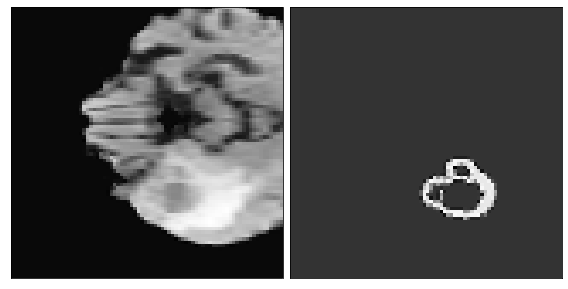

Patch and prediction


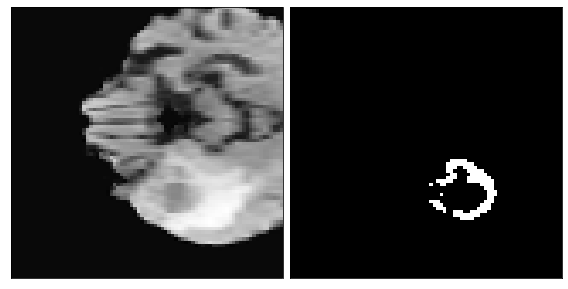

In [30]:
tx, ty = get_sub_volume(t_img[0], t_label[0])
tx = standardize(tx)
patch_pred = model.predict(np.expand_dims(tx,0))

threshold = 0.5
patch_pred[patch_pred > threshold] = 1
patch_pred[patch_pred <= threshold] = 0

print("Patch and ground truth")
visualize_patch(tx[:, :, :, 0], ty[..., 2])
plt.show()
print("Patch and prediction")
visualize_patch(tx[:, :, :, 0], patch_pred[0, :, :, :, 2])
plt.show()

In [31]:
df = get_eval_metrics(patch_pred[0], ty)
print(df)

# Edema
TP: 367, FP: 627
FN: 1, TN: 100497

# Non-Enhancing Tumor
TP: 3299, FP: 467
FN: 612, TN: 93855

# Enhancing Tumor
TP: 377, FP: 76
FN: 43, TN: 99856

                    Edema Non-Enhancing Tumor Enhancing Tumor
Sensitivity        0.9973              0.8435          0.8976
Specificity        0.9938               0.995          0.9992
Balanced Accuracy  0.9955              0.9193          0.9484


### Evaluate in 3D Full Scan

In [31]:
def get_labeled_img(img, label, is_categorical=True):
    if not is_categorical:
        label = keras.utils.to_categorical(convert_mask_label(label), num_classes=4).astype('uint8')

    img = cv2.normalize(img[:, :, :, 0], None, alpha=0, beta=255,
                        norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F).astype('uint8')
    
    labeled_img = np.zeros_like(label[:, :, :, 1:])

    labeled_img[:, :, :, 0] = img * (label[:, :, :, 0])
    labeled_img[:, :, :, 1] = img * (label[:, :, :, 0])
    labeled_img[:, :, :, 2] = img * (label[:, :, :, 0])

    labeled_img += label[:, :, :, 1:] * 255
    
    return labeled_img

In [33]:
def predict(img, label, model, threshold=0.5, loc=(100, 100, 50), display=True):
    img_labeled = get_labeled_img(img.copy(), label.copy(), False)
    
    model_pred = np.zeros((80,80,160,3))
    
    for z in range(0, img.shape[2], 16):
        patch = np.zeros((img.shape[0],img.shape[1],160,4))
        p = img[...,z:min(z+16, img.shape[2]),:]
        patch[..., :p.shape[2], :] = standardize(p)
        
        pred = model.predict(np.expand_dims(resize(patch), 0))
        
        pred = np.where(pred>=threshold, 1, 0)
        model_pred[..., z:z+16, :] = pred
    
    model_pred = model_pred[0:80, 0:80, 0:155, :]
    model_pred = resize(model_pred, 160, 160, 155, interp=cv2.INTER_AREA)
    
    model_pred_ref = keras.utils.to_categorical(label, num_classes=4).astype('uint8')
    model_pred_ref = resize(model_pred_ref, 160, 160, 155).astype('uint8')
    model_pred_ref[:, :, :, 1:4] = model_pred

    model_labeled_img = get_labeled_img(resize(img,160,160,155), model_pred_ref).astype('uint8')
    model_labeled_img = resize(model_labeled_img, 240, 240, 155).astype('uint8')

    if display:
        fig, ax = plt.subplots(2, 3, figsize=[10, 7])
        x, y, z = loc

        ax[0][0].imshow(np.rot90(img_labeled[x, :, :, :]))
        ax[0][0].set_ylabel('Ground Truth', fontsize=15)
        ax[0][0].set_title('Sagittal', fontsize=15)

        ax[0][1].imshow(np.rot90(img_labeled[:, y, :, :]))
        ax[0][1].set_title('Coronal', fontsize=15)

        ax[0][2].imshow(np.squeeze(img_labeled[:, :, z, :]))
        ax[0][2].set_title('Transverse', fontsize=15)

        ax[1][0].imshow(np.rot90(model_labeled_img[x, :, :, :]))
        ax[1][0].set_ylabel('Prediction', fontsize=15)

        ax[1][1].imshow(np.rot90(model_labeled_img[:, y, :, :]))
        ax[1][2].imshow(model_labeled_img[:, :, z, :])

        fig.subplots_adjust(wspace=0, hspace=.12)

        for i in range(2):
            for j in range(3):
                ax[i][j].set_xticks([])
                ax[i][j].set_yticks([])

    return resize(model_pred_ref, 240, 240, 155).astype('uint8'), model_labeled_img

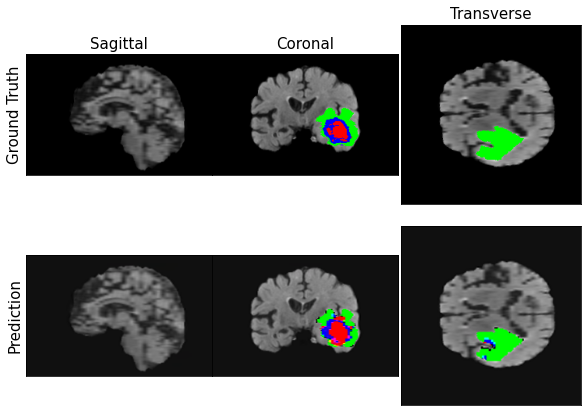

In [34]:
pred, pred_vis = predict(t_img[0], t_label[0], model, loc=(120, 120, 77))

In [35]:
label = keras.utils.to_categorical(t_label[0], num_classes = 4)

whole_scan_metrics = get_eval_metrics(pred[...,1:], label[...,1:])
print(whole_scan_metrics)

# Edema
TP: 9829, FP: 29357
FN: 1898, TN: 8886916

# Non-Enhancing Tumor
TP: 42287, FP: 96583
FN: 8284, TN: 8780846

# Enhancing Tumor
TP: 10045, FP: 27440
FN: 10392, TN: 8880123

                    Edema Non-Enhancing Tumor Enhancing Tumor
Sensitivity        0.8382              0.8362          0.4915
Specificity        0.9967              0.9891          0.9969
Balanced Accuracy  0.9174              0.9127          0.7442


In [36]:
def dynamic_visualize(img, fname, T = 0.01):
    imgs = []
    for i in range(img.shape[0]):
        x = np.rot90(img[min(i, img.shape[0] - 1), :, :])
        y = np.rot90(img[:, min(i, img.shape[1] - 1), :])
        z = img[:, :, min(i, img.shape[2] - 1)]
        x = np.concatenate([x, np.zeros((85, 240, 3))], axis=0).astype('uint8')
        y = np.concatenate([y, np.zeros((85, 240, 3))], axis=0).astype('uint8')
        imgs.append(np.concatenate((x, y, z), axis=1))
    imageio.mimsave(fname + ".gif", imgs, duration = T)
    
    return Image(fname + '.gif', format = 'png')

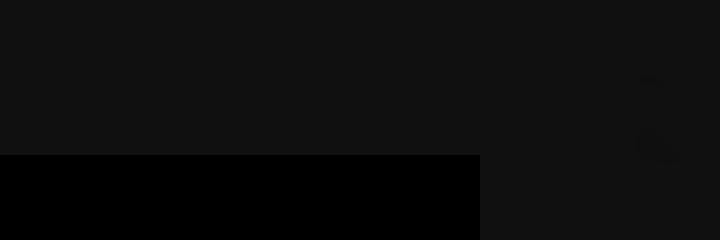

In [35]:
dynamic_visualize(pred_vis, 'pred_0')